In [1]:
import jax
from jax.config import config
config.update("jax_enable_x64", True)

In [ ]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import moscot
from moscot.problems.time import TemporalProblem
import moscot.plotting as mpl

In [ ]:
adata = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/pancreas_multiome_2022_multiVI_embedding.h5ad")

In [ ]:
endocrine_celltypes = [
    "Ductal",
    "Prlf. Ductal",
    "Ngn3 low",
    "Ngn3 high",
    "Ngn3 high cycling",
    "Fev+",
    "Fev+ Alpha",
    "Fev+ Beta",
    "Fev+ Delta",
    "Eps/Delta progenitors",
    "Alpha",
    "Beta",
    "Delta",
    "Epsilon"
]

In [ ]:
adata_red = adata[adata.obs["celltype"].isin(endocrine_celltypes)]

In [ ]:
adata_removed = adata[~adata.obs["celltype"].isin(endocrine_celltypes)]

In [ ]:
adata_removed.obs["celltype"].cat.categories

In [ ]:
adata_red.obs["celltype"].cat.categories

In [ ]:
adata = adata_red.copy()

In [ ]:
adata.obs['time'] = adata.obs.apply(lambda x: 14.5 if x["sample"]=="E14.5" else 15.5, axis=1)

In [ ]:
sc.tl.umap(adata)

In [ ]:
sc.pl.umap(adata, color="celltype")

In [ ]:
sc.pl.umap(adata, color="sample")

In [ ]:
sc.tl.leiden(adata, restrict_to=("celltype", ["Eps/Delta progenitors"]), resolution=0.3, key_added="tmp_1")


In [ ]:
sc.pl.umap(adata, color="tmp_1")

In [ ]:
sc.tl.leiden(adata, restrict_to=("tmp_1", ["Ngn3 high"]), resolution=0.5, key_added="tmp_2")


In [ ]:
sc.pl.umap(adata, color="tmp_2")

In [ ]:
adata.obs["celltype_refined"] = adata.obs["tmp_2"]

In [ ]:
x,y = 'sample', 'celltype_refined'
df = adata.obs.copy()
df1 = df.groupby(x)[y].value_counts(normalize=True)
df1 = df1.mul(100)
df1 = df1.rename('percent').reset_index()

In [ ]:
import seaborn as sns

g = sns.catplot(x="level_1",y='percent',hue=x,kind='bar',data=df1, legend=False,height=8.27, aspect=11.7/8.27)
plt.xlabel("Cell type")
plt.ylabel("Relative frequency in %")
plt.xticks(rotation=45, ha='right')
plt.legend(loc='upper right')
plt.tight_layout()


# MultiVI space

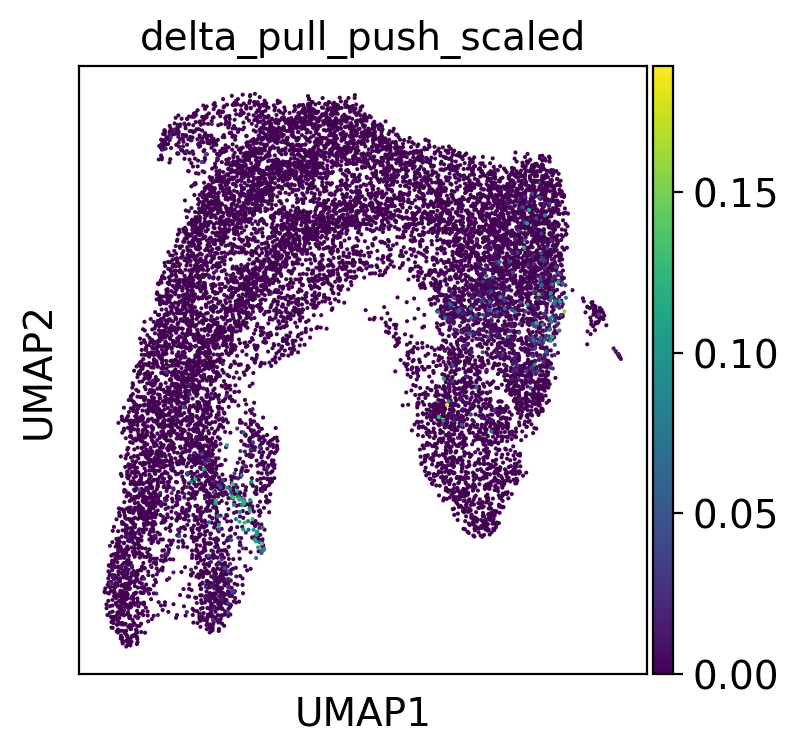

In [131]:
sc.pl.umap(adata, color="delta_pull_push_scaled")

In [132]:
adata.obs["delta_pull"] = (adata.obs["delta_pull"] > np.percentile(adata.obs["delta_pull"], 97))

In [133]:
adata_red = adata[adata.obs["celltype"].isin(["Ngn3 low", "Ductal"])].copy()

In [134]:
adata_red.obs["delta_pull"] = adata_red.obs["delta_pull"].astype("category")

In [135]:
sc.tl.rank_genes_groups(adata_red, 'delta_pull', method='t-test', key_added = "t-test")

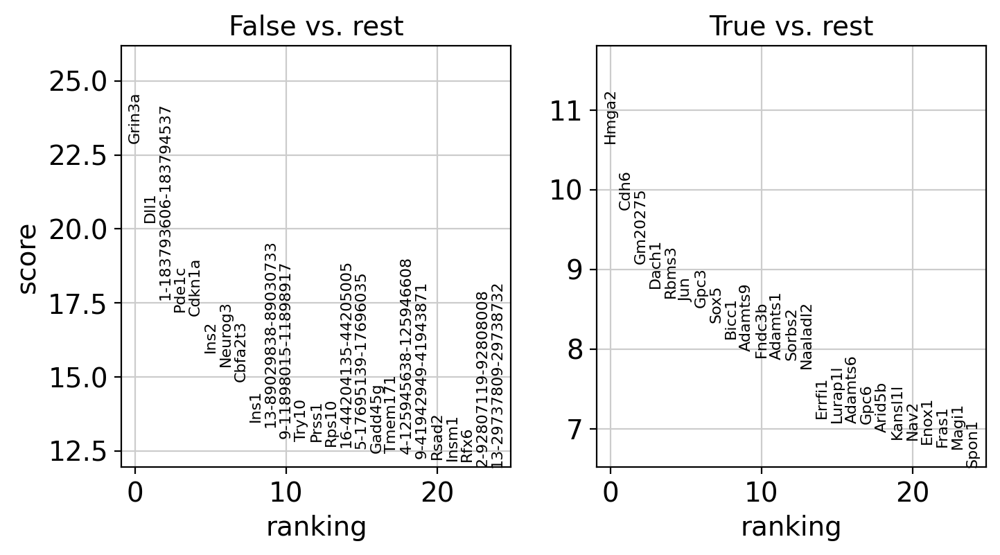

In [136]:
sc.pl.rank_genes_groups(adata_red, n_genes=25, sharey=False, key = "t-test")

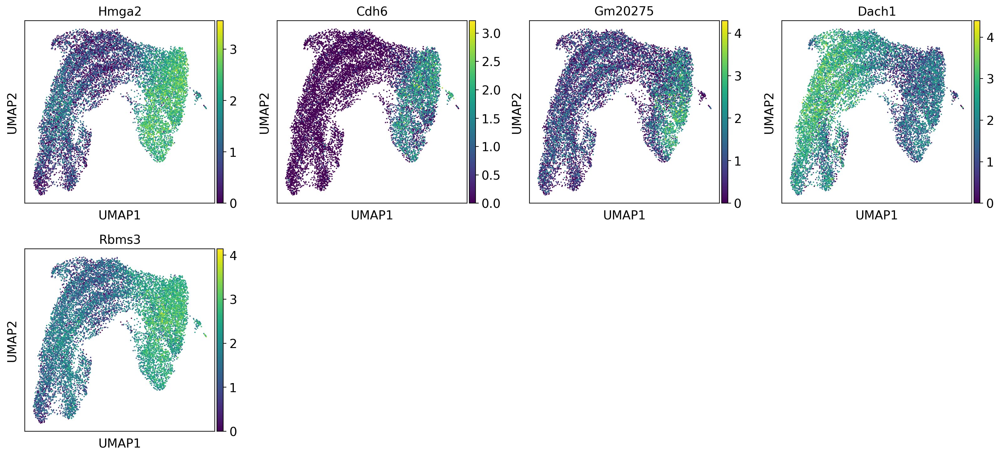

In [137]:
sc.pl.umap(adata, color=["Hmga2", "Cdh6", "Gm20275", "Dach1", "Rbms3"])

In [141]:
adata

AnnData object with n_obs × n_vars = 13668 × 200535
    obs: 'batch_id', 'modality', '_scvi_batch', 'celltype', 'sample', 'time', 'tmp_1', 'tmp_2', 'celltype_refined', 'proliferation', 'apoptosis', 'pull', 'plot_tmp', 'delta_pull', 'test', 'delta_pull_push', 'delta_pull_push_scaled'
    var: 'n_cells', 'feature_type'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'celltype_colors', 'multi_vi', 'neighbors', 'sample_colors', 'umap', 'leiden', 'tmp_1_colors', 'tmp_2_colors', 'moscot_results', 'celltype_refined_colors', 't-test'
    obsm: 'X_multi_vi', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances', 'multi_vi_connectivities', 'multi_vi_distances'

In [142]:
adata_2 = adata.copy()

In [144]:
ngn3_indices = adata_2[adata_2.obs["celltype"].isin(["Ngn3 high", "Ngn3 low"])].obs.index

In [147]:
to_remove = np.random.choice(ngn3_indices, int(len(ngn3_indices)*2/3), replace=False)

In [148]:
len(to_remove)

3382

In [150]:
adata_2 = adata_2[~adata_2.obs.index.isin(to_remove)]

In [151]:
sc.tl.umap(adata_2)

/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


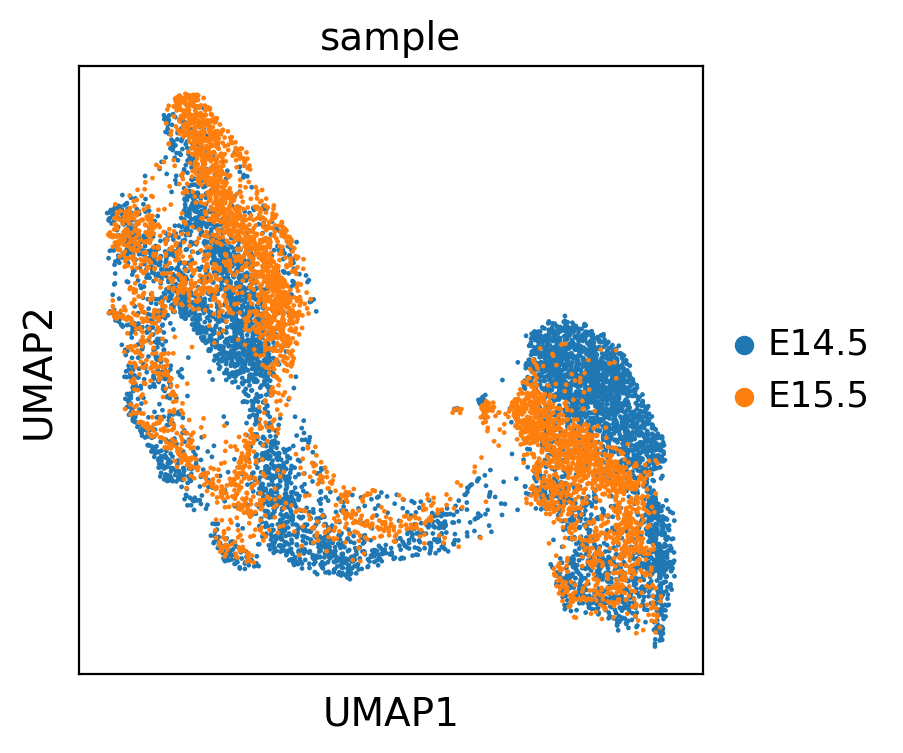

In [155]:
sc.pl.umap(adata_2, color="sample")

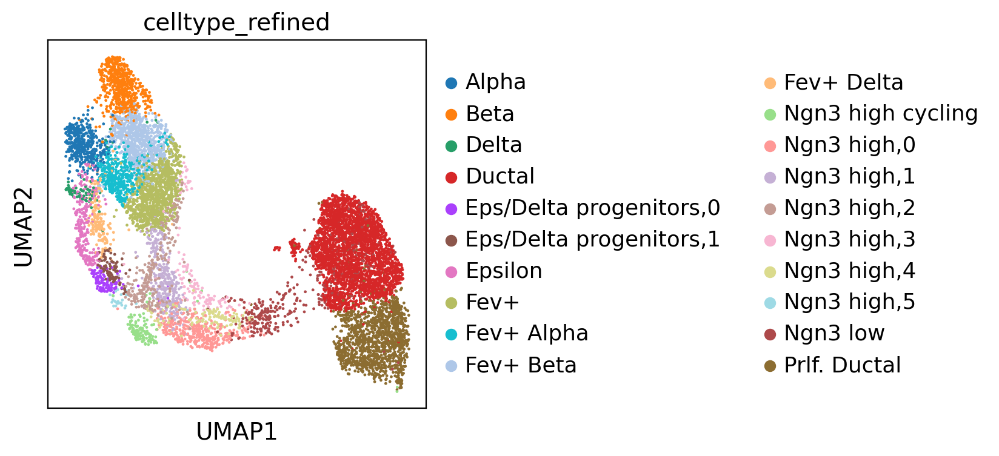

In [154]:
sc.pl.umap(adata_2, color="celltype_refined")

In [164]:
tp0 = TemporalProblem(adata_2)
tp0 = tp0.score_genes_for_marginals(gene_set_proliferation="mouse", gene_set_apoptosis="mouse")
tp0 = tp0.prepare("time", joint_attr="X_multi_vi")

/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


/home/icb/dominik.klein/miniconda3/envs/jax_gpu2/lib/python3.9/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [165]:
tp0 = tp0.solve(epsilon=1e-2, scale_cost="mean", max_iterations=1e5)

/home/icb/dominik.klein/git_repos/moscot/moscot/solvers/_base_solver.py:163: UserWarning: Solver did not converge
  warnings.warn("Solver did not converge")


In [166]:
ct_desc = tp0.cell_transition(start=14.5, end=15.5, early_annotation="celltype_refined", late_annotation="celltype_refined", forward=True)

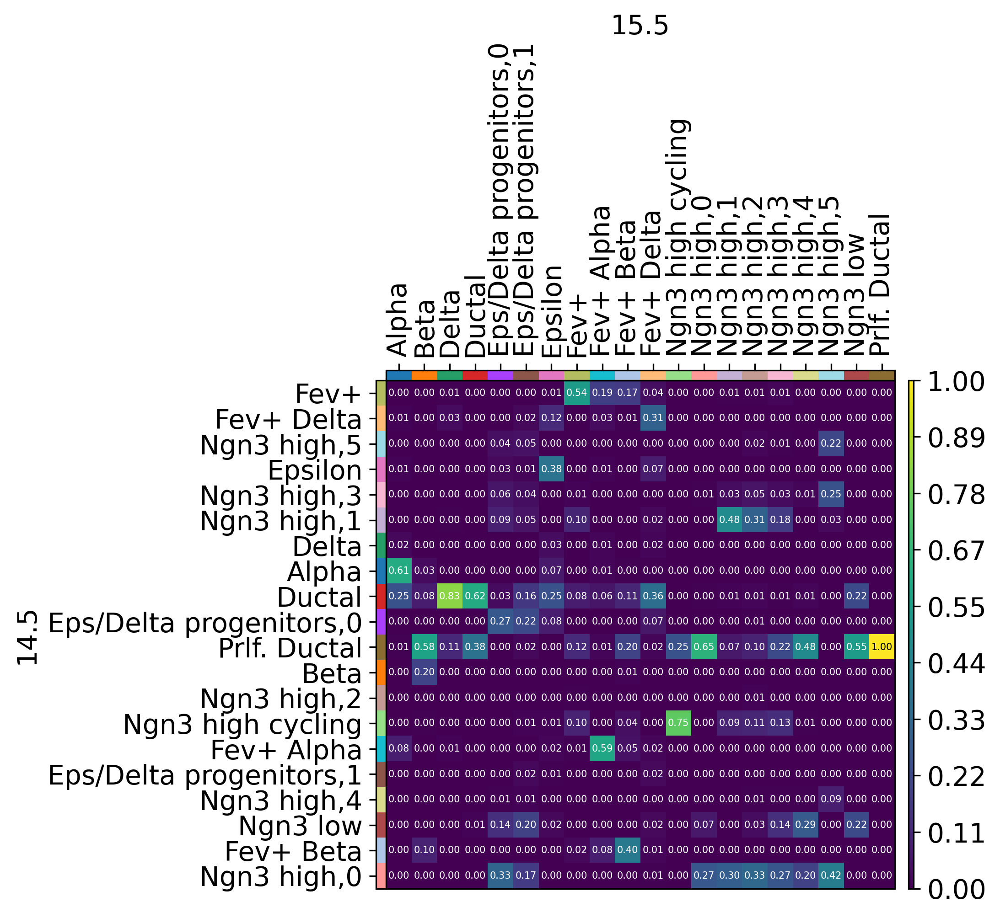

In [174]:
mpl.cell_transition(tp0, dpi=150, fontsize=5)

In [168]:
ct_ans = tp0.cell_transition(start=14.5, end=15.5, early_annotation="celltype_refined", late_annotation="celltype_refined", forward=False)

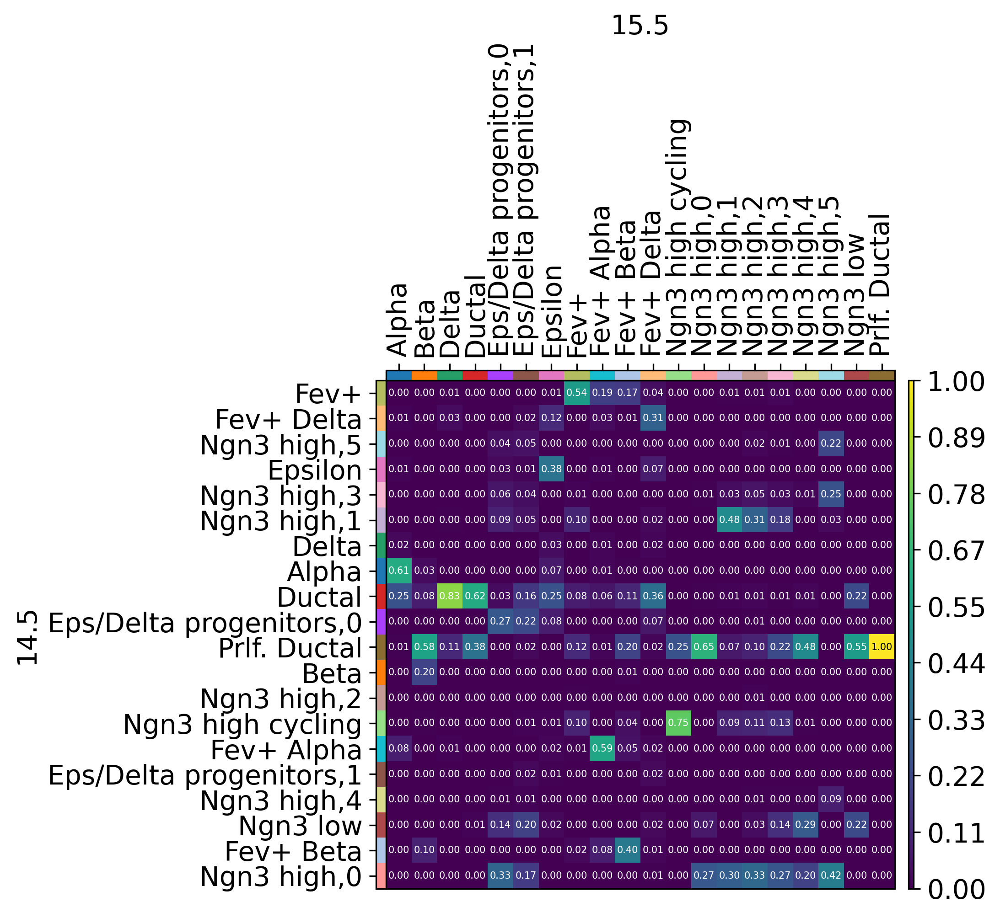

In [173]:
mpl.cell_transition(tp0, dpi=150, fontsize=5)

In [170]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Delta", key_added="delta_pull")

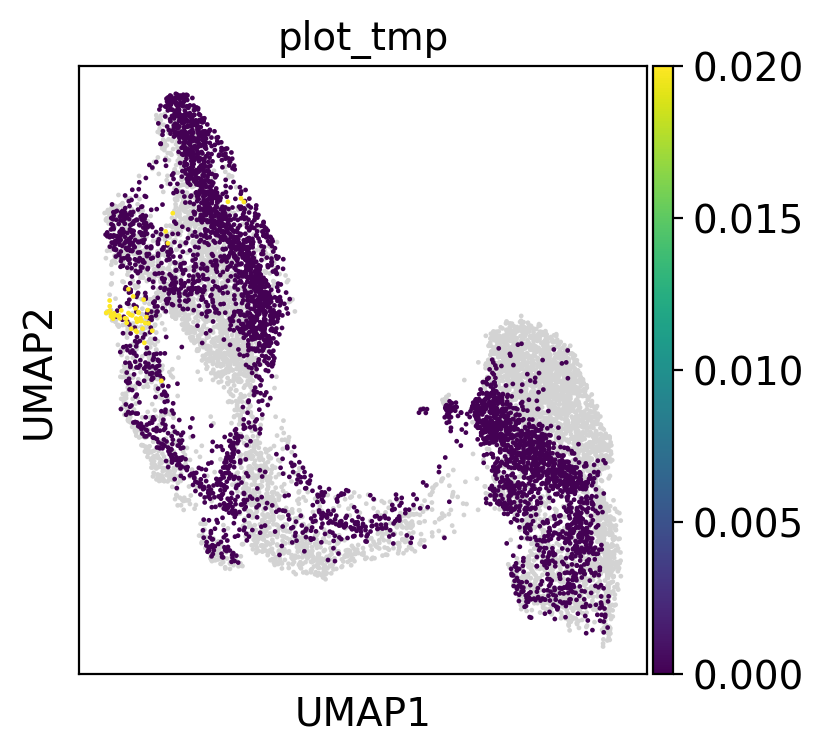

In [171]:
mpl.pull(tp0, time_points=[15.5])

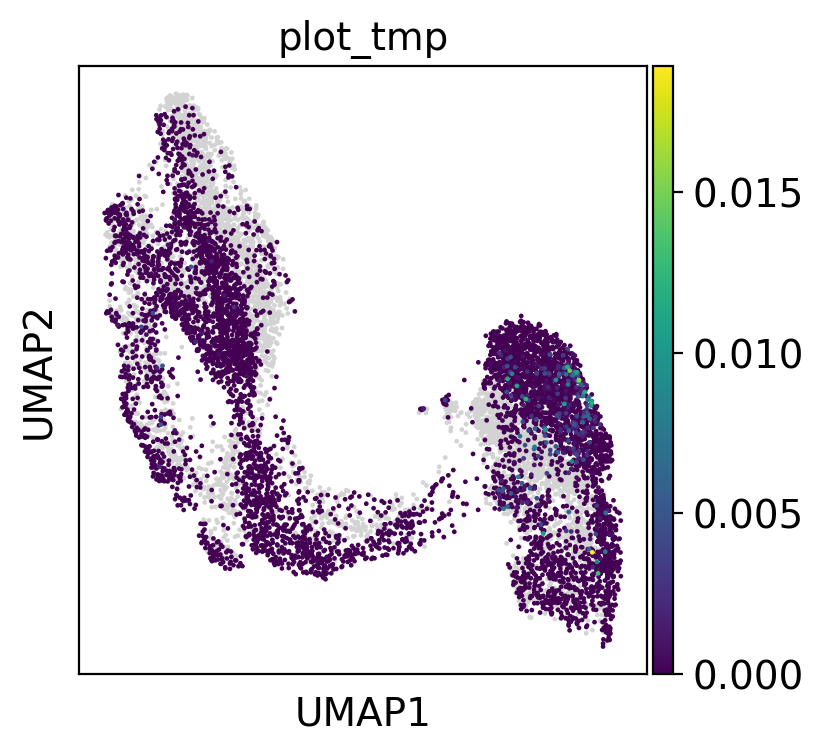

In [172]:
mpl.pull(tp0, time_points=[14.5])

In [140]:
sc.pl.umap("Neurg3")

AttributeError: 'str' object has no attribute '_sanitize'

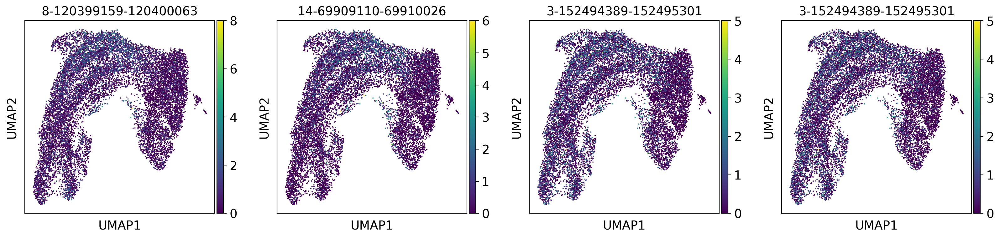

In [110]:
sc.pl.umap(adata, color=["8-120399159-120400063", "14-69909110-69910026", "3-152494389-152495301", "3-152494389-152495301"])

In [109]:
adata_red.uns

OverloadedDict, wrapping:
	{'_scvi_manager_uuid': '4a5bf57b-5942-4392-8e61-c1190aefbd7a', '_scvi_uuid': '2ba7b5c5-d68e-4aef-947a-864a9b522ef6', 'celltype_colors': array(['#d62728', '#c49c94'], dtype=object), 'multi_vi': {'connectivities_key': 'multi_vi_connectivities', 'distances_key': 'multi_vi_distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 15, 'random_state': 0, 'use_rep': 'X_multi_vi'}}, 'neighbors': {'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'correlation', 'n_neighbors': 16, 'n_pcs': 30, 'random_state': 0}}, 'sample_colors': array(['#1f77b4', '#ff7f0e'], dtype=object), 'umap': {'params': {'a': 0.5830300198047571, 'b': 1.3341669935028304}}, 'leiden': {'params': {'resolution': 0.5, 'random_state': 0, 'n_iterations': -1}}, 'tmp_1_colors': array(['#d62728', '#c5b0d5'], dtype='<U7'), 'tmp_2_colors': array(['#d62728', '#ad494a'], dtype='<U7'), 'moscot_results': {'cell_transition': {'cell_tr

In [77]:
mpl.push(tp0, time_points=[14.5], key_stored="delta_pull_push_scaled")

KeyError: 'delta_pull_push_scaled'

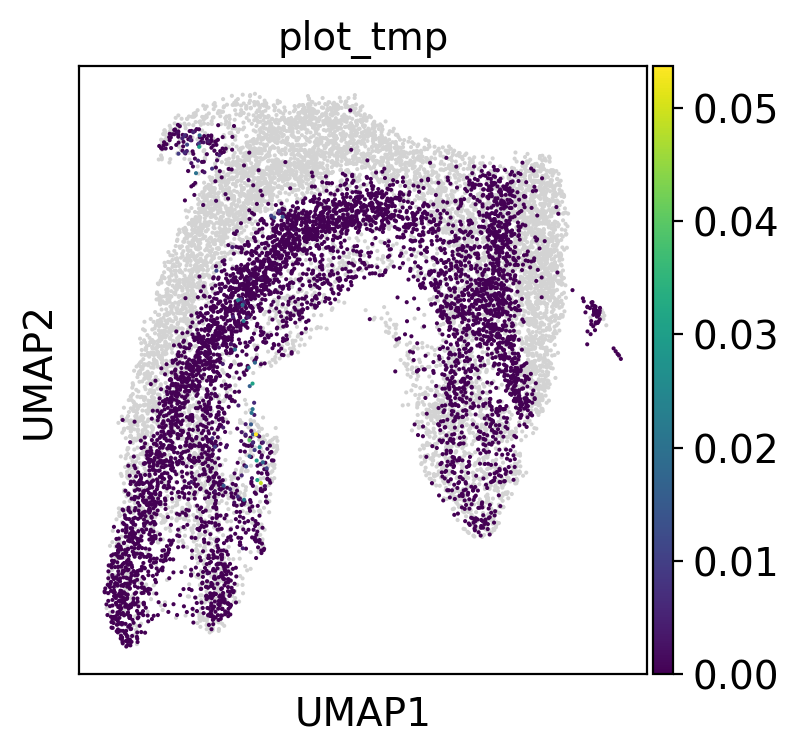

In [32]:
mpl.push(tp0, time_points=[15.5])

In [33]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Epsilon")

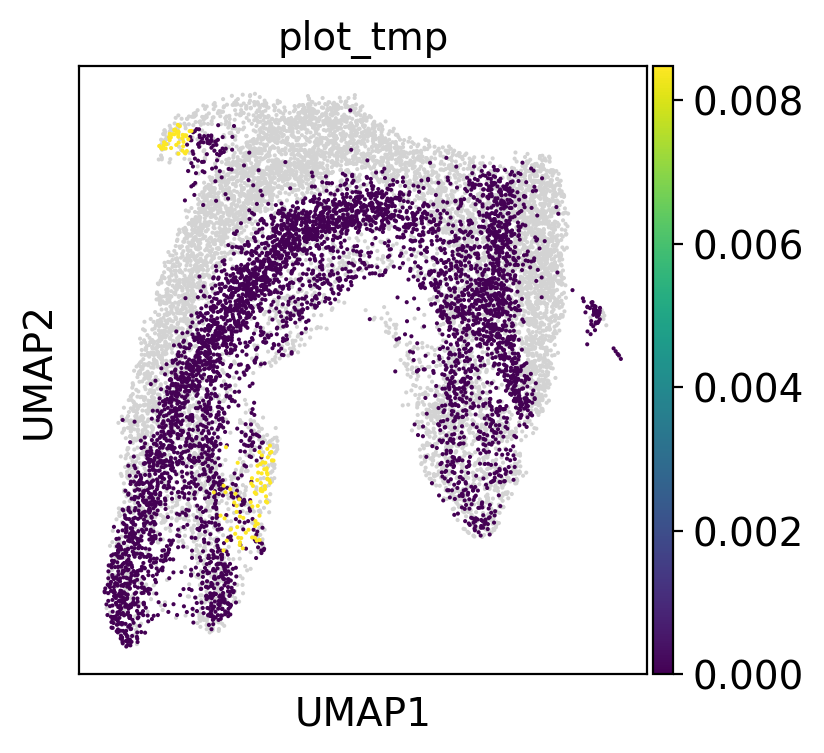

In [34]:
mpl.pull(tp0, time_points=[15.5])

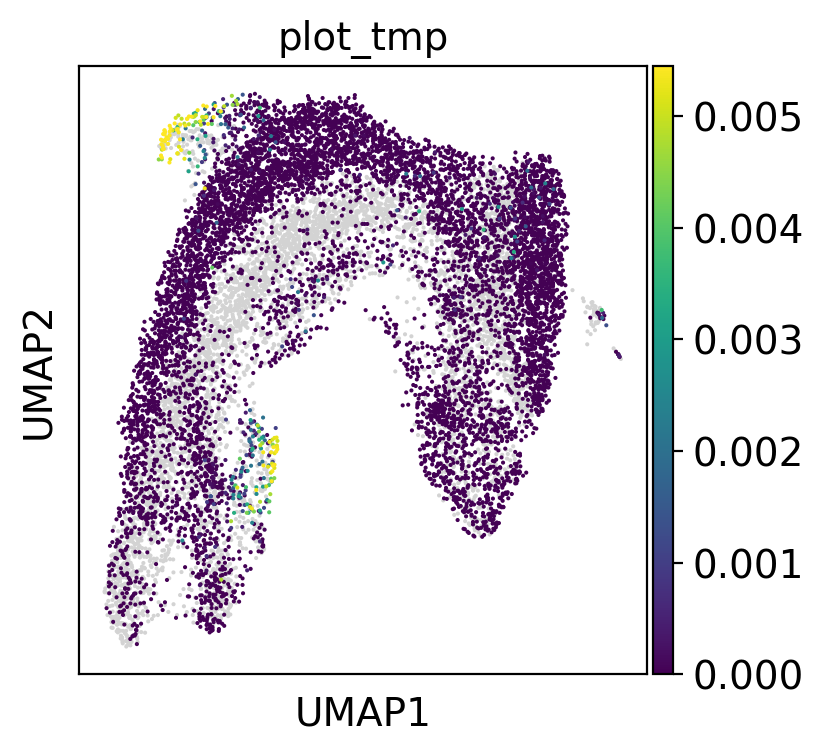

In [35]:
mpl.pull(tp0, time_points=[14.5])

In [36]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Delta")

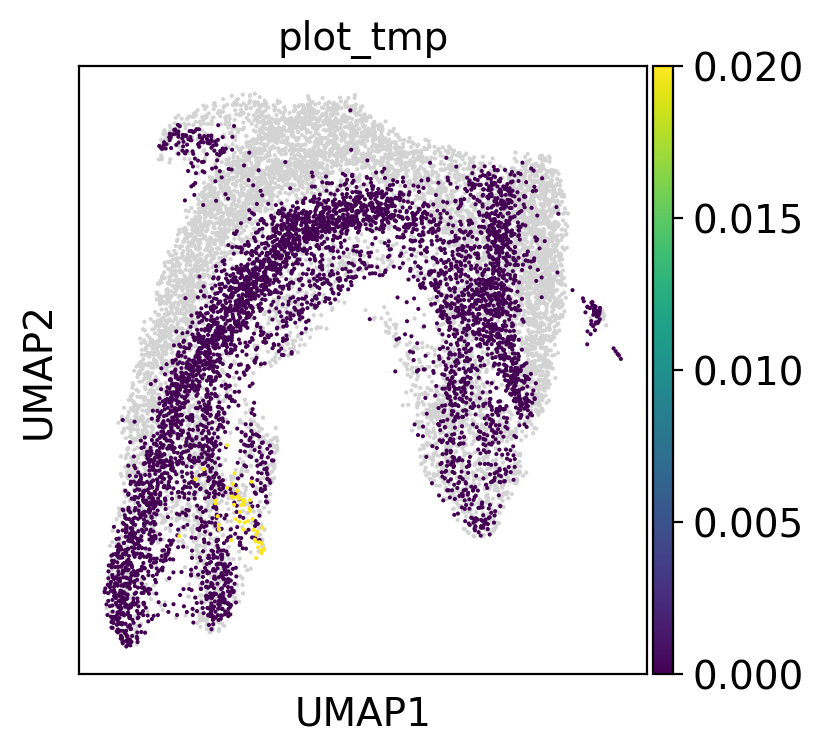

In [37]:
mpl.pull(tp0, time_points=[15.5])

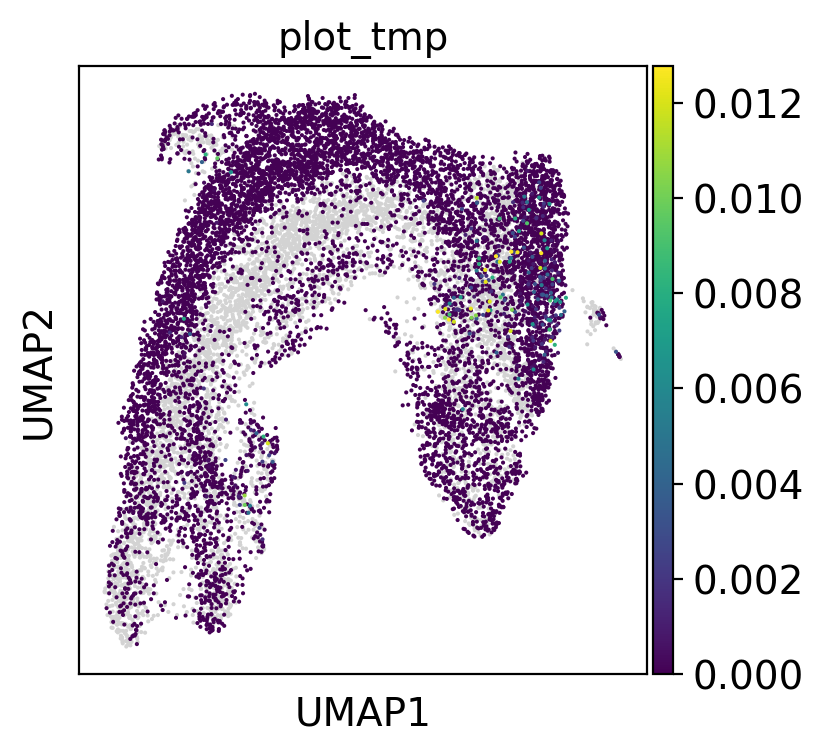

In [38]:
mpl.pull(tp0, time_points=[14.5])

In [39]:
tp0.pull(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

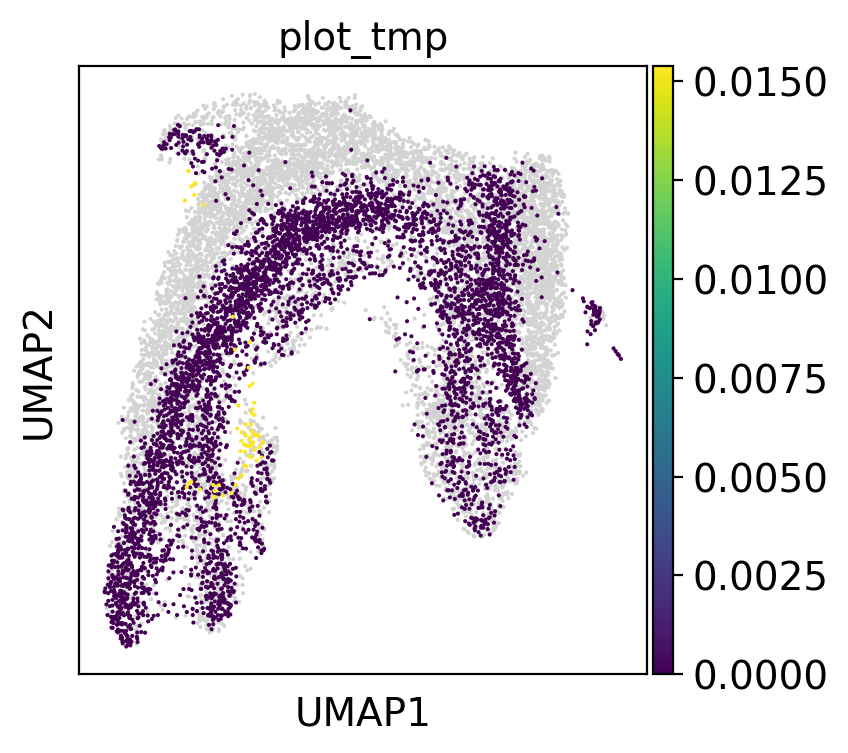

In [40]:
mpl.pull(tp0, time_points=[15.5])

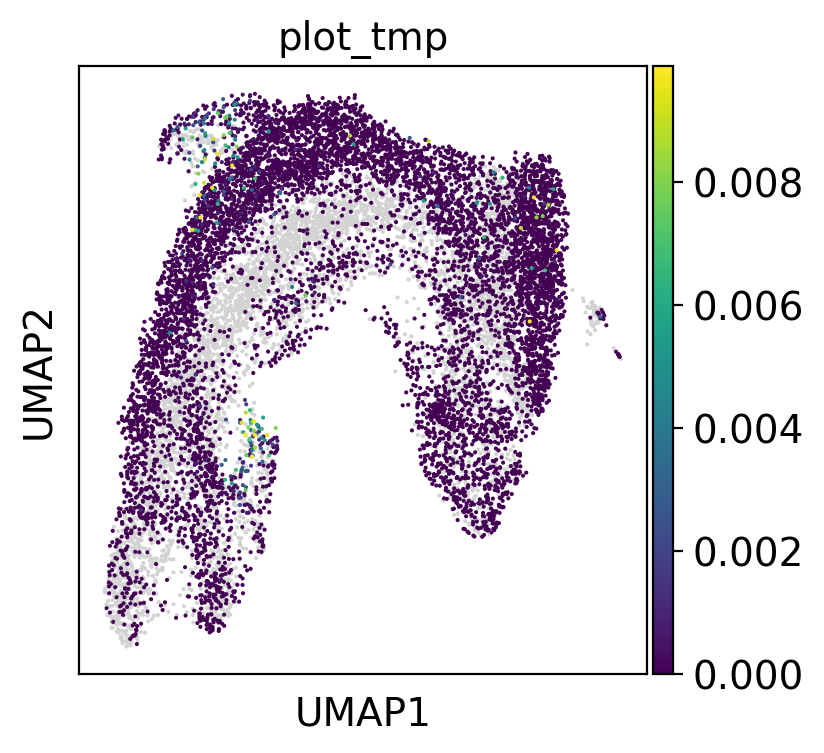

In [41]:
mpl.pull(tp0, time_points=[14.5])

In [42]:
tp0.push(14.5, 15.5, data="celltype_refined", subset="Fev+ Delta")

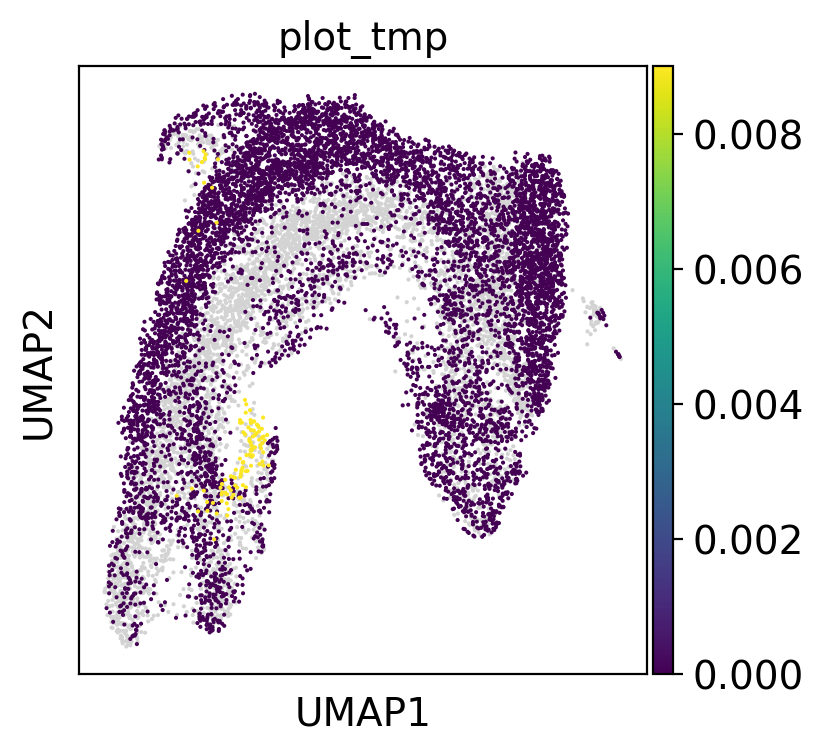

In [43]:
mpl.push(tp0, time_points=[14.5])

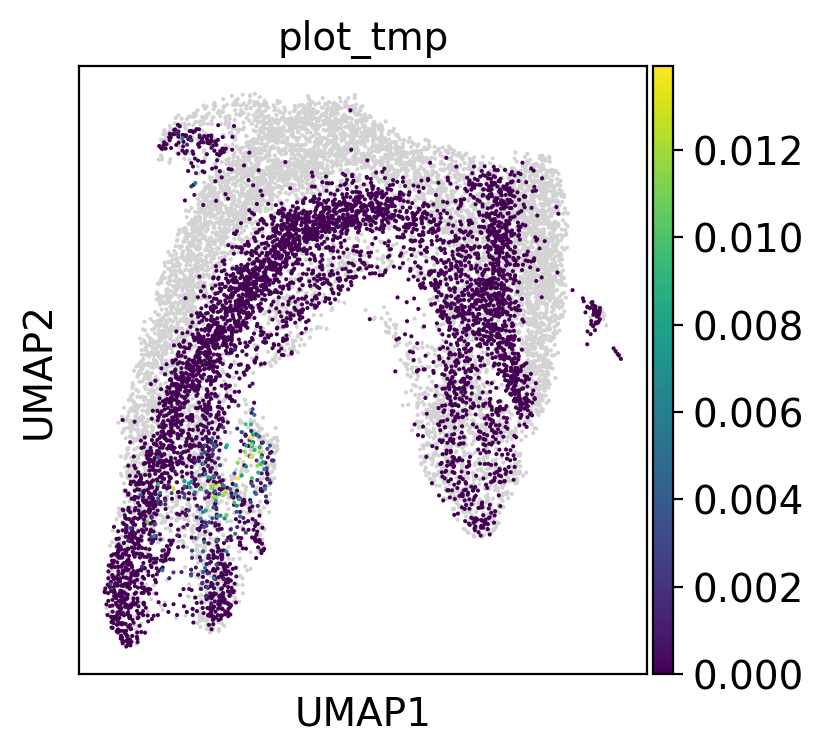

In [44]:
mpl.push(tp0, time_points=[15.5])

In [45]:
sc.tl.leiden(adata, restrict_to=("celltype_refined", ["Fev+ Delta"]), resolution=0.5, key_added="tmp_3")

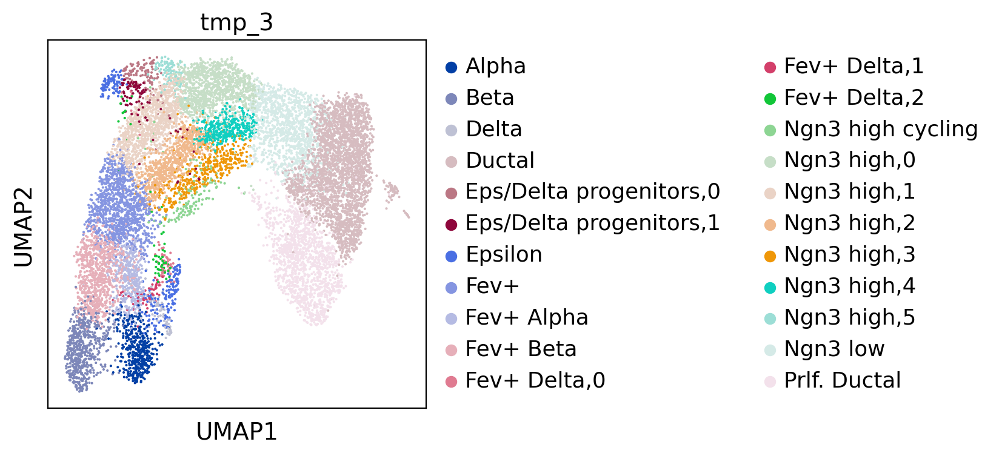

In [46]:
sc.pl.umap(adata, color="tmp_3")

In [47]:
tp1 = TemporalProblem(adata)
tp1 = tp0.prepare("time", joint_attr="X_multi_vi")
tp1 = tp0.solve(epsilon=1e-2, scale_cost="mean")

In [48]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=True)

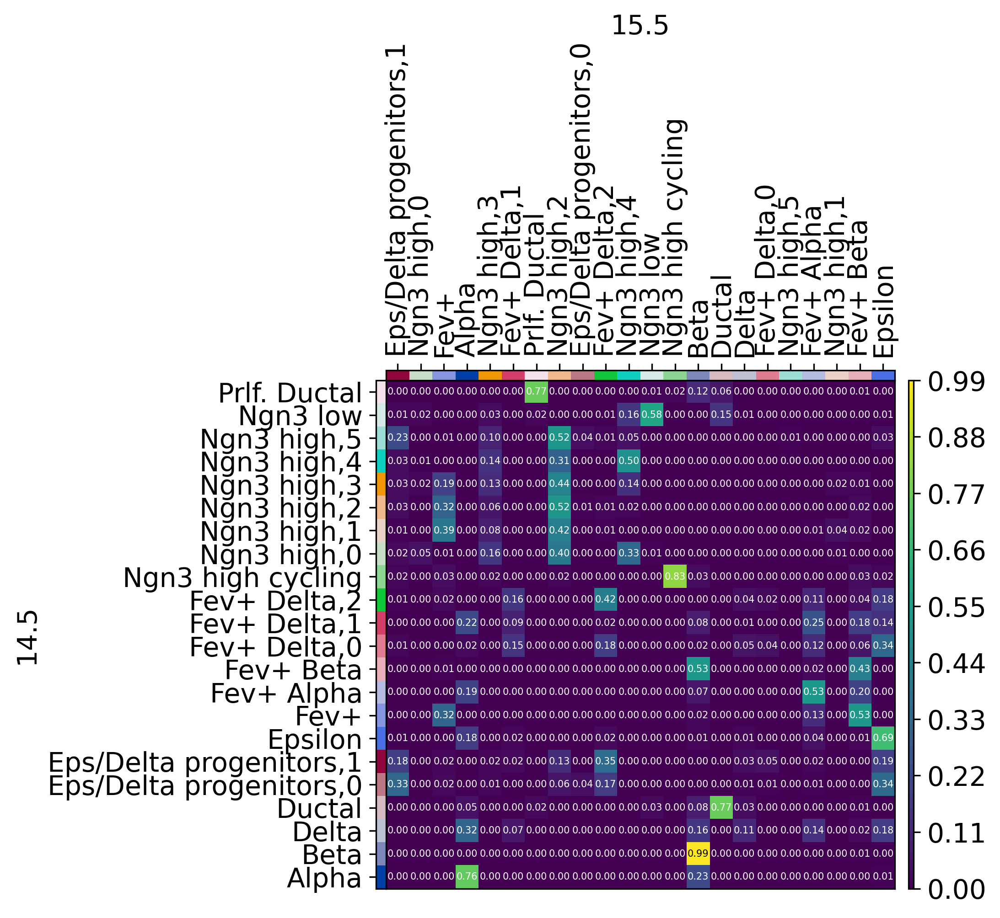

In [49]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [50]:
_ = tp1.cell_transition(14.5, 15.5, early_annotation="tmp_3", late_annotation="tmp_3", forward=False)

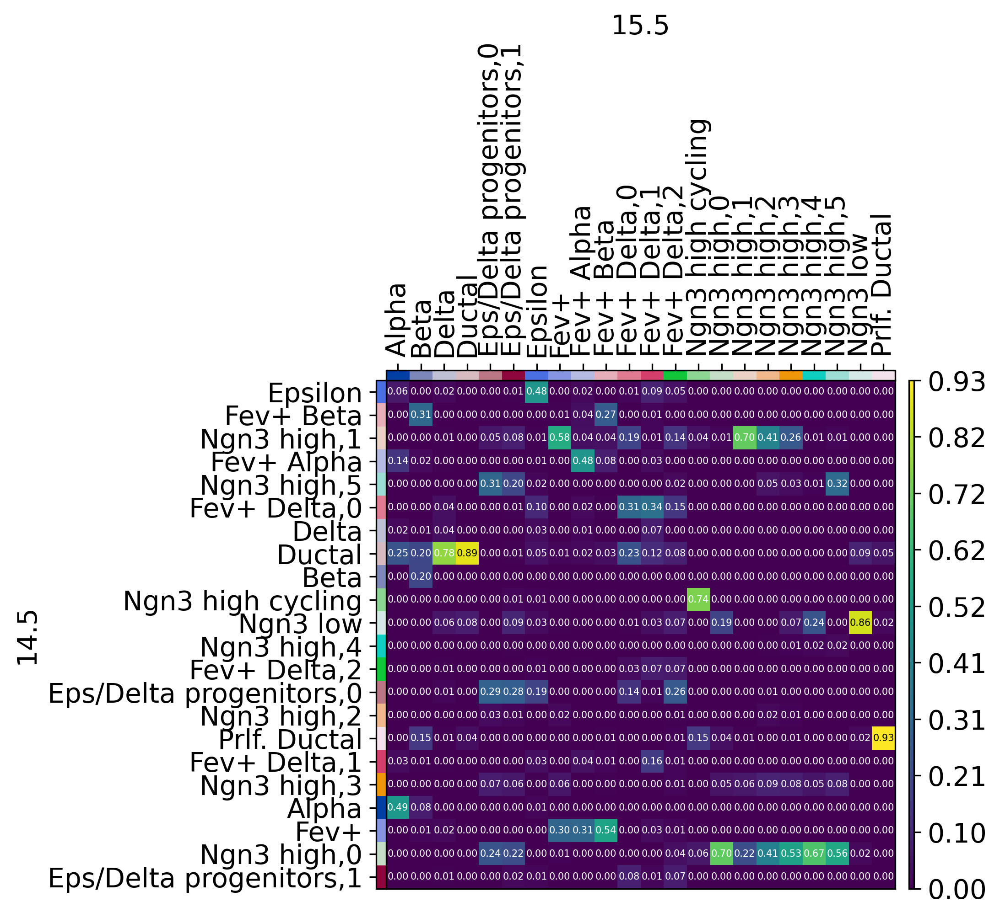

In [51]:
mpl.cell_transition(tp1, dpi=150, fontsize=5)

In [52]:
ct_to_keep = ["Fev+ Delta,0", "Fev+ Delta,1", "Fev+ Delta,2", "Eps/Delta progenitors,0", "Eps/Delta progenitors,1", "Epsilon", "Delta"]
adata_reduced_2 = adata[adata.obs["tmp_3"].isin(ct_to_keep)]

In [53]:
adata_reduced_2 = adata_reduced_2[:, adata_reduced_2.var["feature_type"]=="Gene Expression"]

In [54]:
genes_to_consider = ["Fev", "Hhex", "Gcg", "Sst", "Ghrl", "Pyy", "Ppy"]

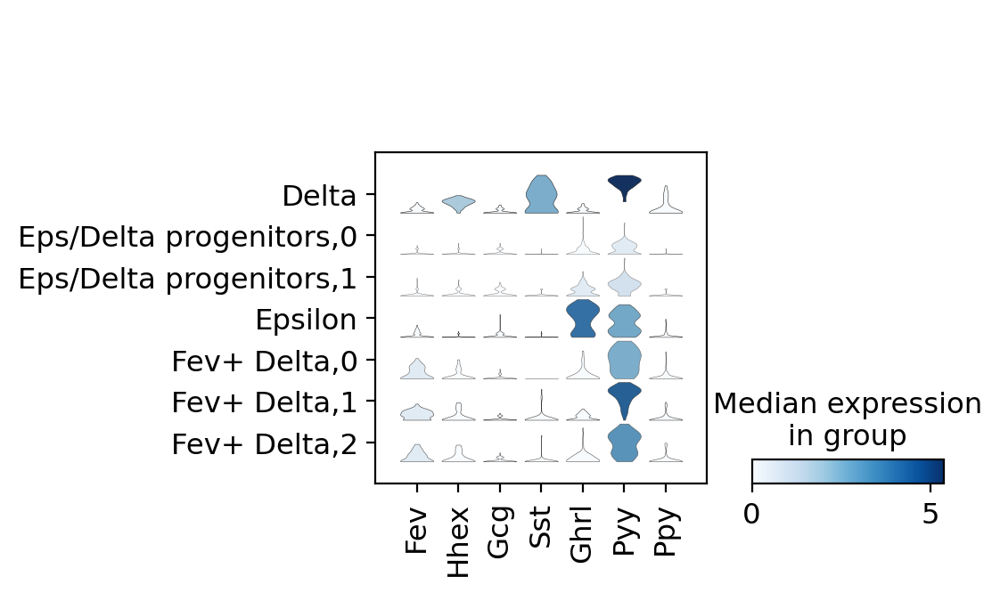

In [55]:
sc.pl.stacked_violin(adata_reduced_2, var_names=genes_to_consider, groupby="tmp_3")

In [56]:
fev_plus_eps = ['Tmem184c', 'Psmc2', 'Spint1', 'Ubl3', 'Sdcbp', 'Pclo', 'Lpcat3', 'Hpca', 'Cer1', 'Drap1', 'Lrrc42', 'Ppp3ca', 'Abhd15']

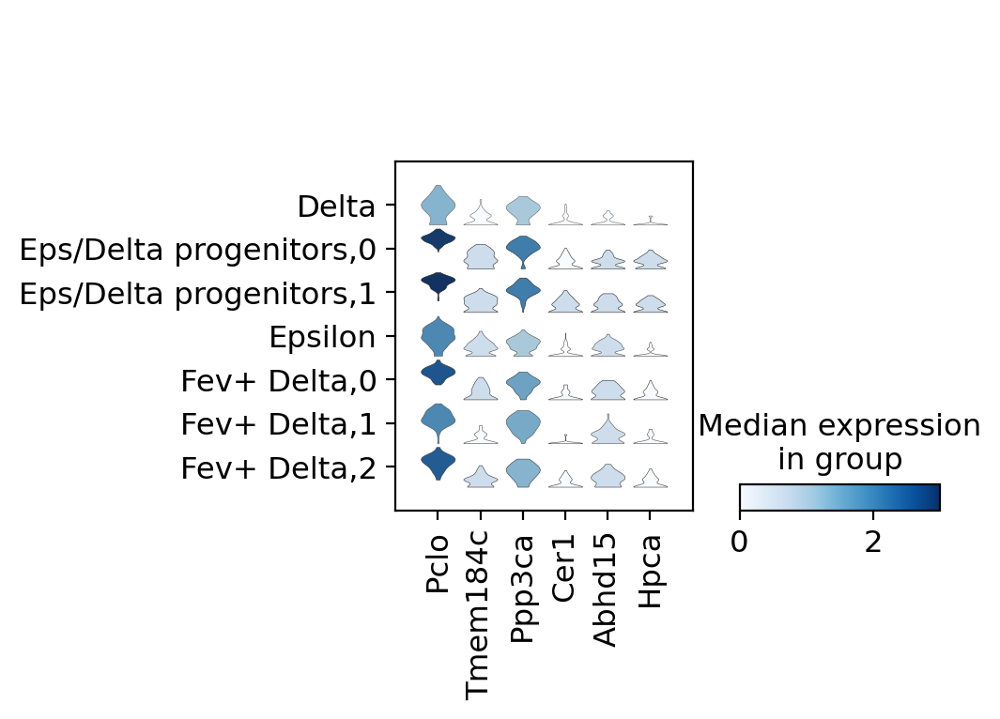

In [57]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(fev_plus_eps))), groupby="tmp_3")

In [58]:
epsilon = ['Maged2', 'Txndc12', 'Prdx5', 'Cd164', 'Gng4', 'Pnmal2', 'Card19', 'Fam174a', 'Gm11837', 'Lrrtm3', 'Sin3b', 'Alcam', 'Ghrl', 'Lamp1', 'Fhl2', 'Anpep', 'Rbpms', 'Atraid', 'Ghrl', 'Maged2', 'Mboat4']

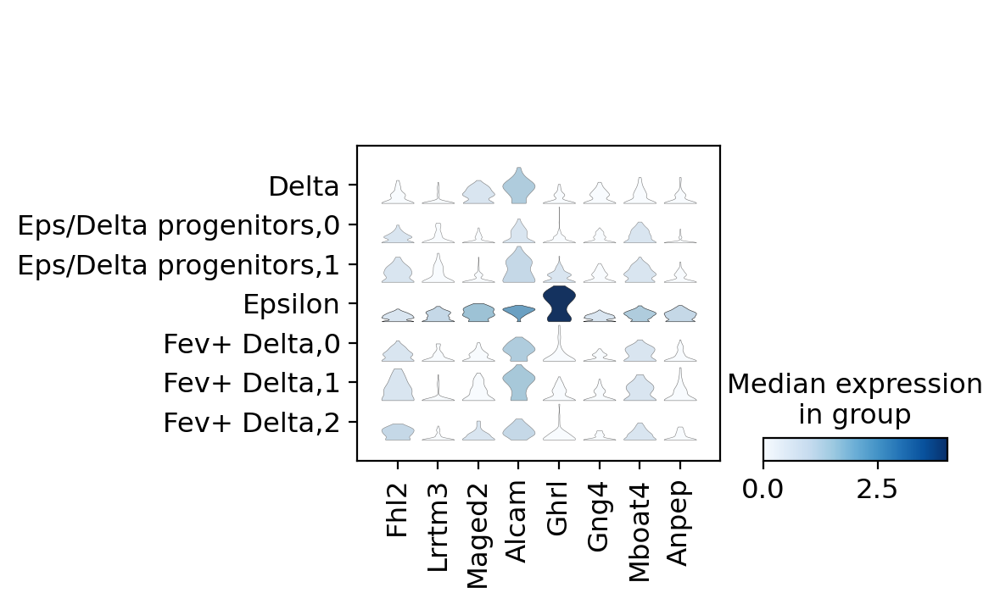

In [59]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(epsilon))), groupby="tmp_3")

In [60]:
delta = ['Cd24a', 'Hhex', 'Pyy', 'Rbp4', 'Sst']

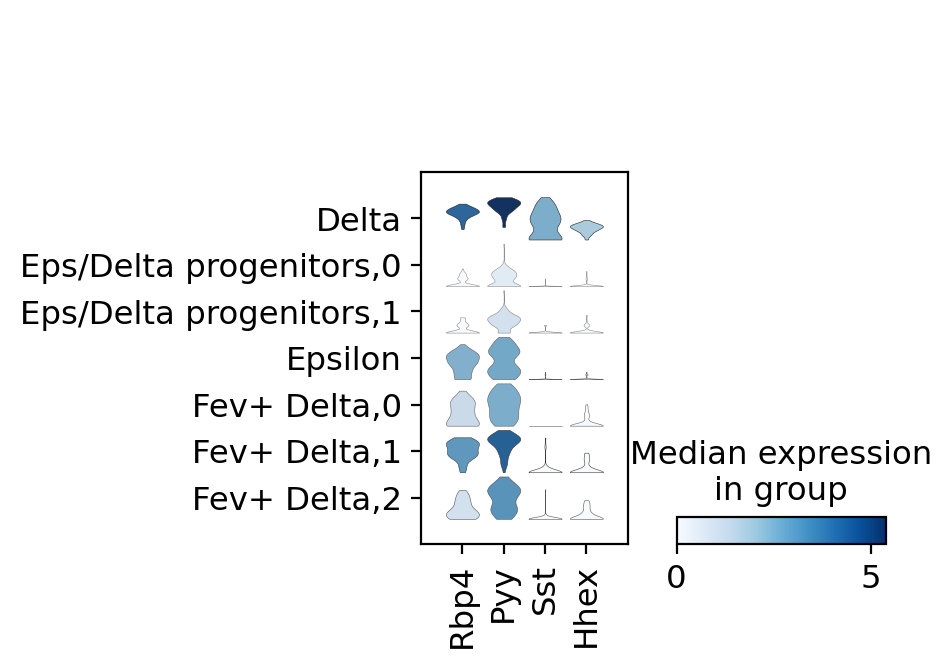

In [61]:
sc.pl.stacked_violin(adata_reduced_2, var_names=list(set(adata.var.index).intersection(set(delta))), groupby="tmp_3")

In [62]:
tp1.pull(14.5, 15.5, data="tmp_3", subset="Delta", key_added="delta_pull")

In [63]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull"] > np.percentile(adata.obs["delta_pull"], 98)

In [64]:
adata.obs["delta_pull_thresholded"] = adata.obs["delta_pull_thresholded"].astype(float)

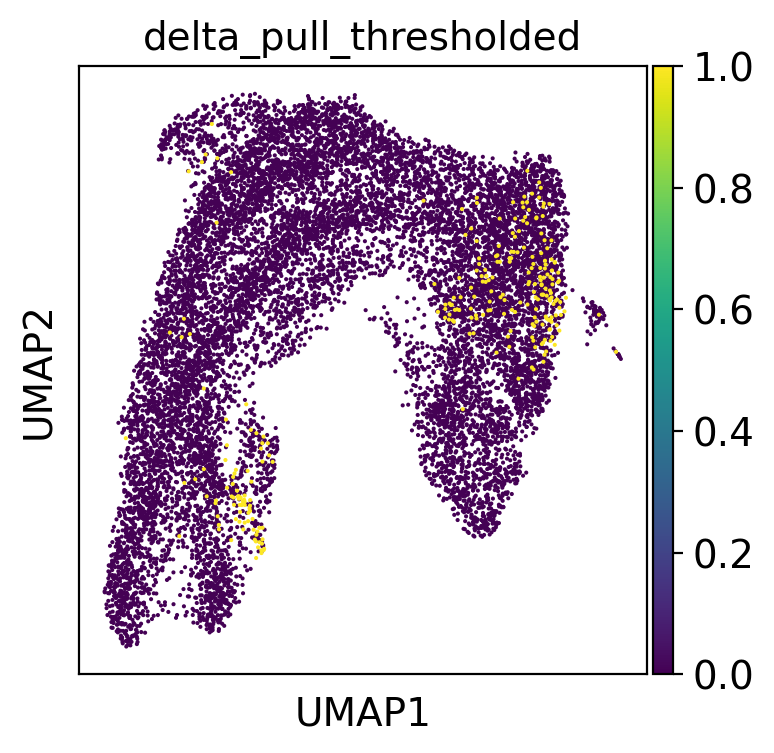

In [65]:
sc.pl.umap(adata, color="delta_pull_thresholded")

In [66]:
def helper2(x):
    if (x["celltype_refined"] == "Ngn3 low") and (x["delta_pull_thresholded"]==1):
        return "ngn3_low_pull"
    if (x["celltype_refined"] in ["Fev+ Delta"]) and (x["delta_pull_thresholded"]==1):
        return "fev_pos_pull"
    return x["celltype_refined"]

In [67]:
adata.obs["tmp_5"] = adata.obs.apply(helper2, axis=1)

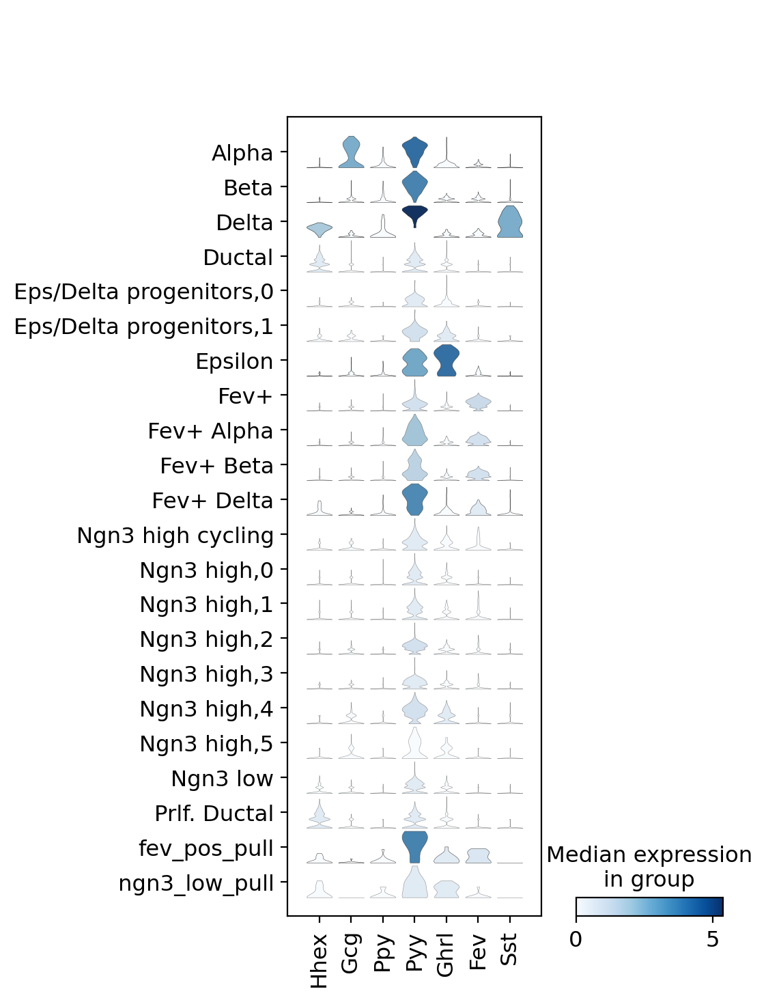

In [68]:
sc.pl.stacked_violin(adata, var_names=list(set(adata.var.index).intersection(set(genes_to_consider))), groupby="tmp_5")


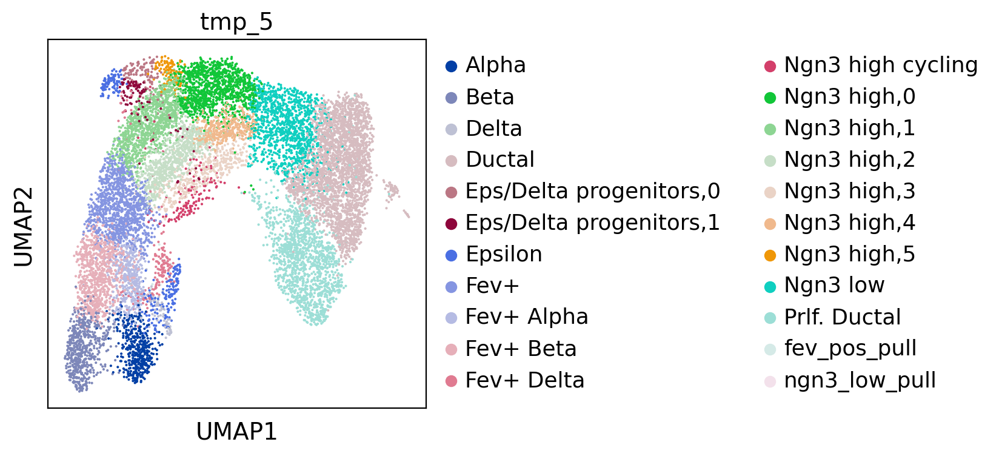

In [69]:
sc.pl.umap(adata, color="tmp_5")

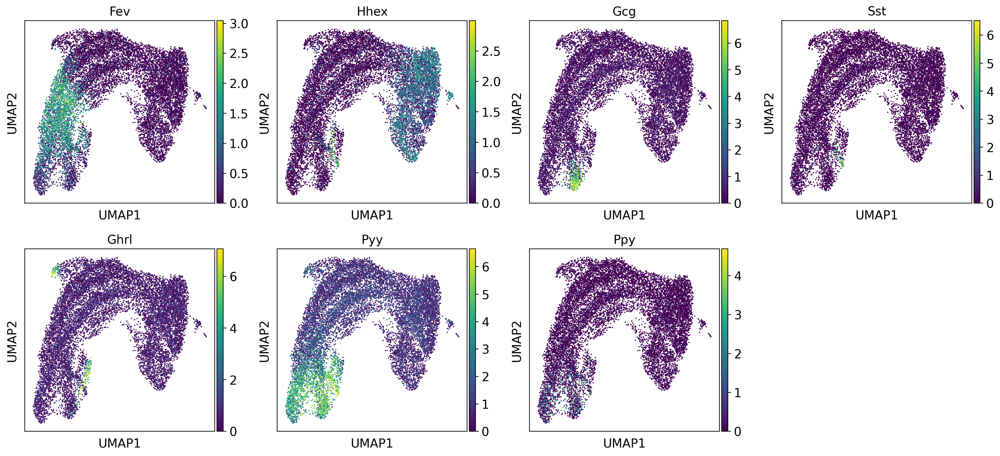

In [70]:
sc.pl.umap(adata, color=genes_to_consider)